In [2]:
import pandas as pd
import numpy as np
import seaborn as sns #plotting
import plotly.express as px
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score,mean_absolute_error,adjusted_rand_score,mean_squared_error
# import plotly.offline as pyo
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression,ElasticNet
from sklearn.tree import DecisionTreeRegressor

from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import GradientBoostingRegressor,RandomForestRegressor
from lightgbm import LGBMRegressor
from xgboost.sklearn import XGBRegressor
from sklearn.ensemble import VotingRegressor


# Set notebook mode to work in offline
# pyo.init_notebook_mode()
# %matplotlib inline
import warnings
warnings.warn('my warning')

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:24: UserWarning: my warning


In [3]:
!pip install openpyxl

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.1/242.1 kB 1.6 MB/s eta 0:00:00a 0:00:01


In [4]:
df = pd.read_excel("../input/data-energy/Riyadh.xlsx")

In [5]:
df.head(10)

,# Date,Time,Global Horiz,Clear-Sky,Top of Atmosphere,Code,Temperature,Relative Humidity,Pressure,Wind speed,Wind direction,Rainfall,Snowfall
0,2004-02-01,00:15,0.0,0.0,0.0,1,283.09,66.20,941.87,3.49,190.19,0.0,0
1,2004-02-01,00:30,0.0,0.0,0.0,1,282.98,66.32,941.88,3.48,191.85,0.0,0
2,2004-02-01,00:45,0.0,0.0,0.0,1,282.89,66.39,941.92,3.47,193.08,0.0,0
3,2004-02-01,01:00,0.0,0.0,0.0,1,282.80,66.41,941.98,3.46,193.89,0.0,0
4,2004-02-01,01:15,0.0,0.0,0.0,1,282.72,66.43,942.05,3.44,194.71,0.0,0
5,2004-02-01,01:30,0.0,0.0,0.0,1,282.63,66.44,942.11,3.43,195.54,0.0,0
6,2004-02-01,01:45,0.0,0.0,0.0,1,282.56,66.40,942.20,3.42,196.01,0.0,0
7,2004-02-01,02:00,0.0,0.0,0.0,1,282.49,66.32,942.30,3.41,196.14,0.0,0
8,2004-02-01,02:15,0.0,0.0,0.0,1,282.42,66.22,942.40,3.40,196.26,0.0,0
9,2004-02-01,02:30,0.0,0.0,0.0,1,282.34,66.13,942.50,3.39,196.39,0.0,0


In [6]:
df.shape

(72960, 13)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72960 entries, 0 to 72959
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   # Date             72960 non-null  object 
 1   Time               72960 non-null  object 
 2   Global Horiz       72960 non-null  float64
 3   Clear-Sky          72960 non-null  float64
 4   Top of Atmosphere  72960 non-null  float64
 5   Code               72960 non-null  int64  
 6   Temperature        72960 non-null  float64
 7   Relative Humidity  72960 non-null  float64
 8   Pressure           72960 non-null  float64
 9   Wind speed         72960 non-null  float64
 10  Wind direction     72960 non-null  float64
 11  Rainfall           72960 non-null  float64
 12  Snowfall           72960 non-null  int64  
dtypes: float64(9), int64(2), object(2)
memory usage: 7.2+ MB


In [8]:
data = df.copy()

In [9]:
for feature in data:
    if data[feature].isnull().sum()>0:
        print(feature,":", np.round(data[feature].isnull().mean(),4),'%')

In [10]:
data.describe().to_csv("data.csv")

In [11]:
data.describe().T.style.bar(subset=['mean'], color='#205ff2')\
                            .background_gradient(subset=['count'], cmap='Reds')\
                            .background_gradient(subset=['50%'], cmap='coolwarm')


,count,mean,std,min,25%,50%,75%,max
Global Horiz,72960.000000,52.818608,116.158674,-999.000000,0.000000,0.040650,119.937325,275.225100
Clear-Sky,72960.000000,68.401303,88.546217,0.000000,0.000000,0.462550,147.826775,273.113000
Top of Atmosphere,72960.000000,95.366936,116.767045,0.000000,0.000000,2.040600,207.320475,332.745500
Code,72960.000000,1.914254,1.325336,0.000000,1.000000,2.000000,2.000000,5.000000
Temperature,72960.000000,298.417291,9.721184,274.150000,290.970000,298.600000,305.360000,320.010000
Relative Humidity,72960.000000,24.163186,17.034683,3.140000,11.680000,18.550000,32.270000,100.760000
Pressure,72960.000000,939.321412,5.470850,924.930000,934.850000,939.850000,943.472500,954.280000
Wind speed,72960.000000,3.895181,1.731795,0.030000,2.760000,3.650000,4.840000,13.450000
Wind direction,72960.000000,150.039436,105.308165,0.000000,59.397500,139.825000,207.802500,359.990000
Rainfall,72960.000000,0.003804,0.046409,0.000000,0.000000,0.000000,0.000000,1.820634


In [12]:
data.describe().T.style.bar(subset=['std'], color='#205ff2')\
                            .background_gradient(subset=['count'], cmap='Reds')\
                            .background_gradient(subset=['50%'], cmap='coolwarm')


,count,mean,std,min,25%,50%,75%,max
Global Horiz,72960.000000,52.818608,116.158674,-999.000000,0.000000,0.040650,119.937325,275.225100
Clear-Sky,72960.000000,68.401303,88.546217,0.000000,0.000000,0.462550,147.826775,273.113000
Top of Atmosphere,72960.000000,95.366936,116.767045,0.000000,0.000000,2.040600,207.320475,332.745500
Code,72960.000000,1.914254,1.325336,0.000000,1.000000,2.000000,2.000000,5.000000
Temperature,72960.000000,298.417291,9.721184,274.150000,290.970000,298.600000,305.360000,320.010000
Relative Humidity,72960.000000,24.163186,17.034683,3.140000,11.680000,18.550000,32.270000,100.760000
Pressure,72960.000000,939.321412,5.470850,924.930000,934.850000,939.850000,943.472500,954.280000
Wind speed,72960.000000,3.895181,1.731795,0.030000,2.760000,3.650000,4.840000,13.450000
Wind direction,72960.000000,150.039436,105.308165,0.000000,59.397500,139.825000,207.802500,359.990000
Rainfall,72960.000000,0.003804,0.046409,0.000000,0.000000,0.000000,0.000000,1.820634


In [13]:
data.describe().T.style.bar(subset=['count'], color='#205ff2')\
                            .background_gradient(subset=['std'], cmap='Reds')\
                            .background_gradient(subset=['50%'], cmap='coolwarm')

,count,mean,std,min,25%,50%,75%,max
Global Horiz,72960.000000,52.818608,116.158674,-999.000000,0.000000,0.040650,119.937325,275.225100
Clear-Sky,72960.000000,68.401303,88.546217,0.000000,0.000000,0.462550,147.826775,273.113000
Top of Atmosphere,72960.000000,95.366936,116.767045,0.000000,0.000000,2.040600,207.320475,332.745500
Code,72960.000000,1.914254,1.325336,0.000000,1.000000,2.000000,2.000000,5.000000
Temperature,72960.000000,298.417291,9.721184,274.150000,290.970000,298.600000,305.360000,320.010000
Relative Humidity,72960.000000,24.163186,17.034683,3.140000,11.680000,18.550000,32.270000,100.760000
Pressure,72960.000000,939.321412,5.470850,924.930000,934.850000,939.850000,943.472500,954.280000
Wind speed,72960.000000,3.895181,1.731795,0.030000,2.760000,3.650000,4.840000,13.450000
Wind direction,72960.000000,150.039436,105.308165,0.000000,59.397500,139.825000,207.802500,359.990000
Rainfall,72960.000000,0.003804,0.046409,0.000000,0.000000,0.000000,0.000000,1.820634


In [14]:
data.duplicated().sum()

0

In [15]:
cor = data.corr()

In [16]:
numerical_feature = [feature for feature in data.columns if data[feature].dtypes != 'O']
print("The length of Numerical_values is :",len(numerical_feature))
numerical_feature

The length of Numerical_values is : 11


['Global Horiz',
 'Clear-Sky',
 'Top of Atmosphere',
 'Code',
 'Temperature',
 'Relative Humidity',
 'Pressure',
 'Wind speed',
 'Wind direction',
 'Rainfall',
 'Snowfall']

In [17]:
categorical_feature = [feature for feature in data.columns if data[feature].dtypes =="O"]
print(len(categorical_feature))
categorical_feature

2


['# Date', 'Time']

In [18]:
fig = px.histogram(data, x="Clear-Sky",y='Time')
fig.show()

In [19]:
fig = px.histogram(data, y='Top of Atmosphere',x='Time')
fig.show()

In [20]:
fig = px.histogram(data, y='Top of Atmosphere',x='# Date')
fig.update_layout(bargap=0.2)
fig.show()

In [21]:
fig = px.histogram(data, y= 'Temperature',x='# Date')
fig.update_layout(bargap=0.3)
fig.show()

In [22]:
fig = px.histogram(data, y= 'Wind speed',x='# Date')
fig.update_layout(bargap=0.2)
fig.show()

In [23]:
fig = px.histogram(data, y="Global Horiz", x="# Date", marginal="box",
                   hover_data=data.columns)
fig.show()

In [24]:
fig = px.box(data,x='# Date',y='Global Horiz',points="all")
fig.show()

In [25]:
fig = px.line(df, x='# Date', y="Temperature")
fig.update_xaxes(rangeslider_visible=True)


fig.show()

In [26]:
fig = px.imshow(cor, text_auto=True, aspect="auto")
fig.show()

# Data Preprocessing

In [27]:
data['# Date'] = pd.to_datetime(data['# Date'])

In [28]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72960 entries, 0 to 72959
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   # Date             72960 non-null  datetime64[ns]
 1   Time               72960 non-null  object        
 2   Global Horiz       72960 non-null  float64       
 3   Clear-Sky          72960 non-null  float64       
 4   Top of Atmosphere  72960 non-null  float64       
 5   Code               72960 non-null  int64         
 6   Temperature        72960 non-null  float64       
 7   Relative Humidity  72960 non-null  float64       
 8   Pressure           72960 non-null  float64       
 9   Wind speed         72960 non-null  float64       
 10  Wind direction     72960 non-null  float64       
 11  Rainfall           72960 non-null  float64       
 12  Snowfall           72960 non-null  int64         
dtypes: datetime64[ns](1), float64(9), int64(2), object(1)
memory 

In [29]:
data['Year'] = data['# Date'].dt.year
data['Month'] = data['# Date'].dt.month
data['Day'] = data['# Date'].dt.day

In [30]:
data.drop('Time',axis=1,inplace=True)

In [31]:
data.drop('# Date',axis=1,inplace=True)

In [32]:
data

,Global Horiz,Clear-Sky,Top of Atmosphere,Code,Temperature,Relative Humidity,Pressure,Wind speed,Wind direction,Rainfall,Snowfall,Year,Month,Day
0,0.0,0.0,0.0,1,283.09,66.20,941.87,3.49,190.19,0.0,0,2004,2,1
1,0.0,0.0,0.0,1,282.98,66.32,941.88,3.48,191.85,0.0,0,2004,2,1
2,0.0,0.0,0.0,1,282.89,66.39,941.92,3.47,193.08,0.0,0,2004,2,1
3,0.0,0.0,0.0,1,282.80,66.41,941.98,3.46,193.89,0.0,0,2004,2,1
4,0.0,0.0,0.0,1,282.72,66.43,942.05,3.44,194.71,0.0,0,2004,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72955,0.0,0.0,0.0,1,285.92,9.30,941.26,4.22,233.00,0.0,0,2006,3,1
72956,0.0,0.0,0.0,1,285.79,9.04,941.22,4.26,234.96,0.0,0,2006,3,1
72957,0.0,0.0,0.0,1,285.65,8.77,941.18,4.29,236.90,0.0,0,2006,3,1
72958,0.0,0.0,0.0,1,285.52,8.56,941.17,4.32,238.55,0.0,0,2006,3,1


In [33]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72960 entries, 0 to 72959
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Global Horiz       72960 non-null  float64
 1   Clear-Sky          72960 non-null  float64
 2   Top of Atmosphere  72960 non-null  float64
 3   Code               72960 non-null  int64  
 4   Temperature        72960 non-null  float64
 5   Relative Humidity  72960 non-null  float64
 6   Pressure           72960 non-null  float64
 7   Wind speed         72960 non-null  float64
 8   Wind direction     72960 non-null  float64
 9   Rainfall           72960 non-null  float64
 10  Snowfall           72960 non-null  int64  
 11  Year               72960 non-null  int64  
 12  Month              72960 non-null  int64  
 13  Day                72960 non-null  int64  
dtypes: float64(9), int64(5)
memory usage: 7.8 MB


In [34]:
data.columns

Index(['Global Horiz', 'Clear-Sky', 'Top of Atmosphere', 'Code', 'Temperature',
       'Relative Humidity', 'Pressure', 'Wind speed', 'Wind direction',
       'Rainfall', 'Snowfall', 'Year', 'Month', 'Day'],
      dtype='object')

In [35]:
X = data.drop('Global Horiz',axis=1)
y = data['Global Horiz']

In [36]:
X_train, X_test, y_train, y_test = train_test_split(
   X, y, test_size=0.33, random_state=42)

In [37]:
y_train

20253      0.0000
41829      0.0000
57240    169.3055
3831       0.0000
62445    103.6447
           ...   
37194    185.3600
6265     165.1203
54886      0.0000
860        0.0000
15795     25.5155
Name: Global Horiz, Length: 48883, dtype: float64

# Linear Regression 

In [38]:
lr = LinearRegression()

In [39]:
lr.fit(X_train,y_train)

LinearRegression()

In [40]:
lr_pred = lr.predict(X_test)

In [41]:
from math import sqrt 

In [42]:
mae1 = mean_absolute_error(y_test,lr_pred)
mse1 = mean_squared_error(y_test,lr_pred)
rmse1 = sqrt(mse1)
r2score1 = r2_score(y_test,lr_pred)
adjust1 = 1 - (1-r2_score(y_test, lr_pred)) * (len(y)-1)/(len(y)-X.shape[1]-1)

# Decision Tree Regressor

In [43]:

dtree = DecisionTreeRegressor().fit(X_train, y_train)
d_predict = dtree.predict(X_test)


In [44]:
mae2 = mean_absolute_error(y_test,d_predict)
mse2 = mean_squared_error(y_test,d_predict)
rmse2 = sqrt(mse2)
r2score2 = r2_score(y_test,d_predict)
adjust2 = 1 - (1-r2_score(y_test, d_predict)) * (len(y)-1)/(len(y)-X.shape[1]-1)

# ElasticNet Regression

In [45]:
reg = ElasticNet(alpha=0.05,l1_ratio=0.9)
reg.fit(X_train,y_train)
y_pred = reg.predict(X_test)


/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.857e+07, tolerance: 6.505e+04



In [46]:
mae3 = mean_absolute_error(y_test,y_pred)
mse3 = mean_squared_error(y_test,y_pred)
rmse3 = sqrt(mse3)
r2score3 = r2_score(y_test,y_pred)
adjust3 = 1 - (1-r2_score(y_test, y_pred)) * (len(y)-1)/(len(y)-X.shape[1]-1)

# RandomForest

In [47]:
rfr = RandomForestRegressor()

In [48]:
rfr.fit(X_train,y_train)
y_pred = rfr.predict(X_test)


In [49]:
mae4 = mean_absolute_error(y_test,y_pred)
mse4 = mean_squared_error(y_test,y_pred)
rmse4 = sqrt(mse4)
r2score4 = r2_score(y_test,y_pred)
adjust4 = 1 - (1-r2_score(y_test, y_pred)) * (len(y)-1)/(len(y)-X.shape[1]-1)

# KNN Regressor

In [50]:
knn = KNeighborsRegressor()

In [51]:
knn.fit(X_train,y_train)

KNeighborsRegressor()

In [52]:
knn_pred = knn.predict(X_test)

In [53]:
mae5 = mean_absolute_error(y_test,knn_pred)
mse5 = mean_squared_error(y_test,knn_pred)
rmse5 = sqrt(mse5)
r2score5 = r2_score(y_test,knn_pred)
adjust5 = 1 - (1-r2_score(y_test, knn_pred)) * (len(y)-1)/(len(y)-X.shape[1]-1)

# Gradient Boosting Regressor

In [54]:
gbr = GradientBoostingRegressor(learning_rate=5)

In [55]:
gbr.fit(X_train,y_train)

GradientBoostingRegressor(learning_rate=5)

In [56]:
gbr_pred = gbr.predict(X_test)

In [57]:
mae6 = mean_absolute_error(y_test,gbr_pred)
mse6 = mean_squared_error(y_test,gbr_pred)
rmse6 = sqrt(mse6)
r2score6 = r2_score(y_test,gbr_pred)
adjust6 = 1 - (1-r2_score(y_test, gbr_pred)) * (len(y)-1)/(len(y)-X.shape[1]-1)

# LightGradientBoosting Regressor

In [58]:
lgb = LGBMRegressor(learning_rate=10)

In [59]:
lgb.fit(X_train,y_train)

LGBMRegressor(learning_rate=10)

In [60]:
lgb_pred = lgb.predict(X_test)

In [61]:
mae7 = mean_absolute_error(y_test,lgb_pred)
mse7 = mean_squared_error(y_test,lgb_pred)
rmse7 = sqrt(mse7)
r2score7 = r2_score(y_test,lgb_pred)
adjust7 = 1 - (1-r2_score(y_test, lgb_pred)) * (len(y)-1)/(len(y)-X.shape[1]-1)

# Extreme Gradient Boosting Regressor

In [62]:
xgb = XGBRegressor()

In [63]:
xgb.fit(X_train,y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, ...)

In [64]:
xgb_pred = xgb.predict(X_test)

In [65]:
mae8 = mean_absolute_error(y_test,xgb_pred)
mse8 = mean_squared_error(y_test,xgb_pred)
rmse8 = sqrt(mse8)
r2score8 = r2_score(y_test,xgb_pred)
adjust8 = 1 - (1-r2_score(y_test, xgb_pred)) * (len(y)-1)/(len(y)-X.shape[1]-1)

In [66]:
clf1 = LinearRegression()
clf2 = DecisionTreeRegressor(max_leaf_nodes=29, random_state=1)
clf3 = ElasticNet(alpha=0.05,l1_ratio=0.9)
clf4 = RandomForestRegressor(n_estimators=33, random_state=1)
clf5 = KNeighborsRegressor(n_neighbors=22)
clf6 = GradientBoostingRegressor(learning_rate=5)
clf7 = LGBMRegressor(learning_rate=5)
clf8 = XGBRegressor()

In [67]:
vot = VotingRegressor(estimators = [('LinearRegression',clf1),('DecisonTreeRegressor',clf2),('ElasticNet',clf3),('RandomForest',clf4),('KNN',clf5),('GradientBoosting',clf6),('LGBM',clf7), ('XGB',clf8)])
vot.fit(X_train, y_train)
y_pred = vot.predict(X_test)

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.857e+07, tolerance: 6.505e+04



In [68]:
mae9 = mean_absolute_error(y_test,y_pred)
mse9 = mean_squared_error(y_test,y_pred)
rmse9 = sqrt(mse9)
r2score9 = r2_score(y_test,y_pred)
adjust9 = 1 - (1-r2_score(y_test, y_pred)) * (len(y)-1)/(len(y)-X.shape[1]-1)

In [69]:
dic = {
    'Model': ['MeanAbsoluteError','MeanSquaredError','RootMeanSquareError','R2Score','Adjusted R2 Square'],
    'LinearRegression':[mae1,mse1,rmse1,r2score1,adjust1],
    "DecisionTreeRegression":[mae2,mse2,rmse2,r2score2,adjust2],
    'ElasticNetRegression':[mae3,mse3,rmse3,r2score3,adjust3],
    "RandomForestRegressor":[mae4,mse4,rmse4,r2score4,adjust4],
    'KNearestNeighbor':[mae5,mse5,rmse5,r2score5,adjust5],
    "GradientBoosting Regressor":[mae6,mse6,rmse6,r2score6,adjust6],
    "LGBM Regressor":[mae7,mse7,rmse7,r2score7,adjust7],
    "XGB Regressor":[mae8,mse8,rmse8,r2score8,adjust8],
    'Voting Regressor':[mae9,mse9,rmse9,r2score9,adjust9]
}

In [70]:
Dic = pd.DataFrame(dic)

In [82]:
y_test.shape

(24077,)

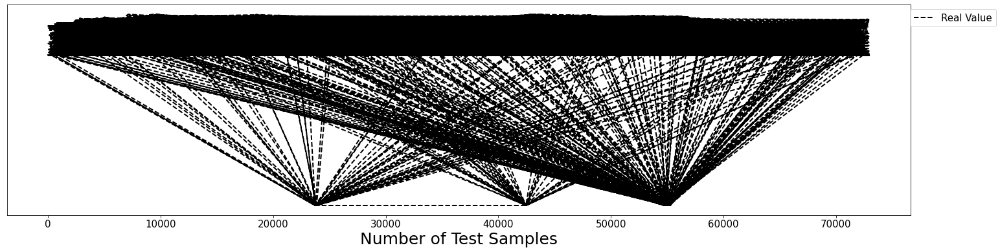

In [81]:
fig = plt.figure(figsize =(25, 6))
ax = fig.add_subplot(1,1,1)
ax.plot( y_test,linewidth=2,color='black',linestyle='dashed', label='Real Value')
#ax.plot( xgb_pred,linewidth=1,color='c',  label='Random Forest')

#ax.set_title('SVM Predictions', fontsize=20)
ax.set_xlabel('Number of Test Samples',fontsize=25)
#ax.set_ylabel('GHI (Wh/m2)',fontsize=20)
#leg = ax.legend(loc=4)
#ax.set_ylabel('Parameters',fontsize=25)
plt.yticks([])
plt.legend(bbox_to_anchor=(1.10,1), loc="upper right", fontsize=15)#leg = ax.legend(loc=(1.04,0), fontsize=20)
ax.tick_params(axis='both', which='major', labelsize=15)
#ax.tick_params(axis='both', which='minor', labelsize=20)
plt.show()

In [71]:
Dic

,Model,LinearRegression,DecisionTreeRegression,ElasticNetRegression,RandomForestRegressor,KNearestNeighbor,GradientBoosting Regressor,LGBM Regressor,XGB Regressor,Voting Regressor
0,MeanAbsoluteError,23.994212,5.710408,23.928567,4.483378,14.351216,1.190858e+62,1.368692e+38,4.185023,1.488573e+61
1,MeanSquaredError,7922.111048,241.256364,7922.556422,130.434273,6453.473030,3.448423e+124,4.541410e+76,94.941111,5.388160e+122
2,RootMeanSquareError,89.006242,15.532429,89.008744,11.420783,80.333511,1.856993e+62,2.131058e+38,9.743773,2.321241e+61
3,R2Score,0.428680,0.982601,0.428648,0.990593,0.534594,-2.486903e+120,-3.275134e+72,0.993153,-3.885786e+118
4,Adjusted R2 Square,0.428578,0.982598,0.428546,0.990592,0.534511,-2.487346e+120,-3.275718e+72,0.993152,-3.886479e+118


In [72]:
Dic.to_csv('Results.csv')

In [76]:
lgb_pred

array([-5.64536063e+37,  9.62291321e+37, -3.15588152e+38, ...,
       -1.79811753e+38,  9.62291321e+37,  9.62291321e+37])